tensor flow mit Keras 



In [1]:
import pandas as pd
pd.__version__

'2.2.0'

In [2]:
import numpy as np
np.__version__

'1.26.3'

In [3]:
import matplotlib as plt
plt.__version__

'3.8.2'

In [4]:
import sys 
sys.version_info

sys.version_info(major=3, minor=10, micro=12, releaselevel='final', serial=0)

In [5]:
import copy
import time
from tabulate import tabulate
from scipy import interpolate
from scipy import stats
import seaborn as sns 


In [6]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt 
from pylab import *

In [7]:
#PRINT_HEAD set to 1 prints always first X (PRINT_ROWS) of the manipulated dataframe after the operation
PRINT_HEAD = 0
PRINT_ROWS = 0
NUMBER_PRINT = 2

#y_range_fr (Year Range From) defines from which year onward the data will be selected 
#y_range_to (Year Range To) defines the year at the end of the dataframe to by analyised 
#y_range (Year Range) creates and index for the dataframe from "year-from" to "year-to"
y_range_fr = 2008
y_range_to = 2022
y_range = np.arange(y_range_fr, y_range_to, 1) 
y_half = int(y_range_to - y_range_fr)

#city_popstruct_df_entnum defines the number of entities of the city population structure data set
city_popstruct_df_entnum = 11#
#city_edustruct_df_entnum defines the number of entities of the city population education data set
city_edustruct_df_entnum = 3
#city_employstruct_df_entnum defines the number of entities of the city employment (sectoral) data set
city_employstruct_df_entnum = 13

#data_records is a dictionary to store the finaly dataframes after manipulation
data_records = dict()
#corr_records is a dictionary to store the correlations of different combinations of dataframes
corr_records = dict()

# Einlesen der Daten
- Bevölkerungsstrukur
- Bildung
- Wirtschaftssektoren und Anstellung in diesen Sektoren

In [8]:
#The individual sheets of the file urb_cpop1__custom_9157489_spreadsheet.xlsx containings the #
#city polulation strucuture data is read and stored in the dictionary city_population_dict_raw
# and city_popstruct_dict_raw for furhter processing

filepath_population = "City_Data_Set/urb_cpop1__custom_9157489_spreadsheet.xlsx"

raw_total_population = pd.read_excel(filepath_population, "Sheet 1", header=7)
raw_total_population_male = pd.read_excel(filepath_population, "Sheet 2", header=7)
raw_total_population_female = pd.read_excel(filepath_population, "Sheet 3", header=7)
raw_total_population_0_to_4 = pd.read_excel(filepath_population, "Sheet 4", header=7)
raw_total_population_5_to_9 = pd.read_excel(filepath_population, "Sheet 5", header=7)
raw_total_population_10_to_14 = pd.read_excel(filepath_population, "Sheet 6", header=7)
raw_total_population_15_to_19 = pd.read_excel(filepath_population, "Sheet 7", header=7)
raw_total_population_20_to_24 = pd.read_excel(filepath_population, "Sheet 8", header=7)
raw_total_population_25_to_34 = pd.read_excel(filepath_population, "Sheet 11", header=7)
raw_total_population_35_to_44 = pd.read_excel(filepath_population, "Sheet 14", header=7)
raw_total_population_45_to_54 = pd.read_excel(filepath_population, "Sheet 17", header=7)
raw_total_population_55_to_64 = pd.read_excel(filepath_population, "Sheet 20", header=7)
raw_total_population_65_to_74 = pd.read_excel(filepath_population, "Sheet 23", header=7)
raw_total_population_75_to_above = pd.read_excel(filepath_population, "Sheet 26", header=7)

city_population_dict_raw = {"total_population"             : raw_total_population,
                            "total_population_male"        : raw_total_population_male,
                            "total_population_female"      : raw_total_population_female,
                            "total_population_0_to_4"      : raw_total_population_0_to_4, 
                            "total_population_5_to_9"      : raw_total_population_5_to_9,
                            "total_population_10_to_14"    : raw_total_population_10_to_14, 
                            "total_population_15_to_19"    : raw_total_population_15_to_19, 
                            "total_population_20_to_24"    : raw_total_population_20_to_24, 
                            "total_population_25_to_34"    : raw_total_population_25_to_34, 
                            "total_population_35_to_44"    : raw_total_population_35_to_44, 
                            "total_population_45_to_54"    : raw_total_population_45_to_54, 
                            "total_population_55_to_64"    : raw_total_population_55_to_64,
                            "total_population_65_to_74"    : raw_total_population_65_to_74, 
                            "total_population_75_to_above" : raw_total_population_75_to_above
                       }

city_popstruct_dict_raw = { "total_population_0_to_4"      : raw_total_population_0_to_4, 
                            "total_population_5_to_9"      : raw_total_population_5_to_9,
                            "total_population_10_to_14"    : raw_total_population_10_to_14, 
                            "total_population_15_to_19"    : raw_total_population_15_to_19, 
                            "total_population_20_to_24"    : raw_total_population_20_to_24, 
                            "total_population_25_to_34"    : raw_total_population_25_to_34, 
                            "total_population_35_to_44"    : raw_total_population_35_to_44, 
                            "total_population_45_to_54"    : raw_total_population_45_to_54, 
                            "total_population_55_to_64"    : raw_total_population_55_to_64,
                            "total_population_65_to_74"    : raw_total_population_65_to_74, 
                            "total_population_75_to_above" : raw_total_population_75_to_above
                       }


/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:

In [9]:
#The individual sheets of the file urb_ceduc__custom_9141047_spreadsheet.xlsx containings the
#city education strucuture data is read and stored in the dictionary city_eduction_dict_raw for 
#furhter processing
filepath_education = "City_Data_Set/urb_ceduc__custom_9141047_spreadsheet.xlsx"

eduction_numberof_dayc = pd.read_excel(filepath_education, "Sheet 11", header=7)
eduction_person_edu_low = pd.read_excel(filepath_education, "Sheet 8", header=7)
eduction_person_edu_mid = pd.read_excel(filepath_education, "Sheet 9", header=7)
eduction_person_edu_high = pd.read_excel(filepath_education, "Sheet 10", header=7)
eduction_wap_edu_mid = pd.read_excel(filepath_education, "Sheet 13", header=7)
eduction_wap_edu_high = pd.read_excel(filepath_education, "Sheet 14", header=7)

city_eduction_dict_raw = {                      
                            #"eduction_numberof_dayc"         : eduction_numberof_dayc,                         
                            "eduction_perons_edu_low"        : eduction_person_edu_low, 
                            "eduction_persons_edu_mid"       : eduction_person_edu_mid, 
                            "eduction_persons_edu_high"      : eduction_person_edu_high,
                            #"eduction_wap_edu_mid"           : eduction_wap_edu_mid,
                            #"eduction_wap_edu_high"          : eduction_wap_edu_high
                       }

/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/dominik/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:

In [10]:
#The individual sheets of the file urb_clma__custom_9141052_spreadsheet.xlsx containings the
#city employment strucuture data is read and stored in the dictionary city_labourmarket_dict_raw for 
#furhter processing
filepath_labourmarket = "City_Data_Set/urb_clma__custom_9141052_spreadsheet.xlsx"

employment_ecoactive_mal = pd.read_excel(filepath_labourmarket, "Sheet 1", header=7)
employment_ecoactive_fem = pd.read_excel(filepath_labourmarket, "Sheet 2", header=7)
employment_ecoactive_wap = pd.read_excel(filepath_labourmarket, "Sheet 3", header=7)
employment_unemploye_pop = pd.read_excel(filepath_labourmarket, "Sheet 9", header=7)
employment_employmen_wap = pd.read_excel(filepath_labourmarket, "Sheet 12", header=7)
employment_employmen_tot = pd.read_excel(filepath_labourmarket, "Sheet 18", header=7)
employment_sec_argi = pd.read_excel(filepath_labourmarket, "Sheet 19", header=7)
employment_sec_manu = pd.read_excel(filepath_labourmarket, "Sheet 20", header=7)
employment_sec_cons = pd.read_excel(filepath_labourmarket, "Sheet 21", header=7)
employment_sec_trad = pd.read_excel(filepath_labourmarket, "Sheet 22", header=7)
employment_sec_itco = pd.read_excel(filepath_labourmarket, "Sheet 23", header=7)
employment_sec_fsin = pd.read_excel(filepath_labourmarket, "Sheet 24", header=7)
employment_sec_real = pd.read_excel(filepath_labourmarket, "Sheet 25", header=7)
employment_sec_psin = pd.read_excel(filepath_labourmarket, "Sheet 26", header=7)
employment_sec_publ = pd.read_excel(filepath_labourmarket, "Sheet 27", header=7)
employment_sec_arts = pd.read_excel(filepath_labourmarket, "Sheet 28", header=7)
employment_unemp_rat = pd.read_excel(filepath_labourmarket, "Sheet 29", header=7)
employment_unemp_mal = pd.read_excel(filepath_labourmarket, "Sheet 30", header=7)
employment_unemp_fem = pd.read_excel(filepath_labourmarket, "Sheet 31", header=7)
employment_activity_rat = pd.read_excel(filepath_labourmarket, "Sheet 32", header=7)

city_labourmarket_dict_raw = {     
                            #"employment_ecoactive_mal" : employment_ecoactive_mal,
                            #"employment_ecoactive_fem" : employment_ecoactive_fem,
                            #"employment_ecoactive_wap" : employment_ecoactive_wap,
                            "employment_unemploye_pop" : employment_unemploye_pop,
                            "employment_employmen_wap" : employment_employmen_wap,
                            "employment_unemp_rat"     : employment_unemp_rat,
                            #"employment_employmen_tot" : employment_employmen_tot,
                            "employment_sec_argi"      : employment_sec_argi,
                            "employment_sec_manu"      : employment_sec_manu,
                            "employment_sec_cons"      : employment_sec_cons,
                            "employment_sec_trad"      : employment_sec_trad,
                            "employment_sec_itco"      : employment_sec_itco,
                            "employment_sec_fsin"      : employment_sec_fsin,
                            "employment_sec_real"      : employment_sec_real,
                            "employment_sec_psin"      : employment_sec_psin,
                            "employment_sec_publ"      : employment_sec_publ,
                            "employment_sec_arts"      : employment_sec_arts
                            #"employment_unemp_mal"     : employment_unemp_mal,
                            #"employment_unemp_fem"     : employment_unemp_fem, 
                            #"employment_activity_rat"  : employment_activity_rat
                       }

In [11]:
#filepath_sec_employment = "Data/City_Data/urb_csec__custom_8822245_spreadsheet.xlsx"
#
#sec_employment = pd.read_excel(filepath_sec_employment, "Sheet1", header=0)
#
#city_sec_employment_raw = {                      
#                            "sec_employment"        : sec_employment
#                       }

In [12]:
#The previously created dictionaries are collected in the data_dict_raw_or dictionary for 
# furhter processing 
data_dict_raw_or = {
                    "city_popstruct_dict_raw"        : city_popstruct_dict_raw,
                    "city_population_dict_raw"       : city_population_dict_raw, 
                    "city_eduction_dict_raw"         : city_eduction_dict_raw, 
                    "city_labourmarket_dict_raw"     : city_labourmarket_dict_raw   
            }

data_dict_non = {}

# Aufbereiten der Datensätze (entfernen von leeren Reihen)

In [13]:
import copy
#A copy of thr raw-dataset is created 
data_dict_raw = copy.deepcopy(data_dict_raw_or)
data_dict_non = {}

#The following procedure iterates over all dataframes in each dictionaries referenced in the data_dict_raw
#dictionary (a deep copy of data_dict_raw_or) and casts all data from the second column to an numeric data type
for key, value in data_dict_raw.items():
    temp_dict = {}
    for data_key, data_value in value.items(): 
        temp_dict[data_key] = pd.concat([data_value.iloc[:,0:2], data_value.iloc[:,2:].apply(pd.to_numeric, downcast='integer', errors='coerce')], axis=1)
    data_dict_non[key] = temp_dict
    

In [14]:
#The following codes displays the first X (NUMBER_PRINT) rows of the manipulated data frame(s)
for key, value in data_dict_non.items():
    print("\n\n key: " + key)
    for data_key, data_value in value.items():
        print("data_key: " + data_key + " rows# " + str(data_value.shape[0]))
        print(data_value.head(NUMBER_PRINT).to_markdown())



 key: city_popstruct_dict_raw
data_key: total_population_0_to_4 rows# 883
|    | TIME           | TIME.1            |   2002 |   2003 |   2004 |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |
|---:|:---------------|:------------------|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|
|  0 | CITIES (Codes) | CITIES (Labels)   |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |    nan |
|  1 | BE001C         | Bruxelles/Brussel |    nan |    nan |  67551 |  69065 |  71167 |  73350 |  75687 |  78722 |  81563 |  85823 |  87788 |  89133 |  89568 |  89490 |  89051 |  87576 |  86101 |  84981 |  83302 |  80361 |  

# DropNA

In [15]:
#The following process iterates over all dataframes and deletes all rows where
#more than half of the year-range (y_range_to - y_range_from) is missing
for key, value in data_dict_non.items():
    temp_dict = {}
    for data_key, data_value in value.items(): 
        temp_dict[data_key] = data_value.dropna(axis='index', thresh=y_half, ignore_index=True)
    data_dict_non[key] = temp_dict

In [16]:
#The following codes displays the first X (NUMBER_PRINT) rows of the manipulated data frame(s)
for key, value in data_dict_non.items():
    print("\n\n key: " + key)
    for data_key, data_value in value.items():
        print("data_key: " + data_key + " rows# " + str(data_value.shape[0]))
        print(data_value.head(NUMBER_PRINT).to_markdown())



 key: city_popstruct_dict_raw
data_key: total_population_0_to_4 rows# 565
|    | TIME   | TIME.1            |   2002 |   2003 |   2004 |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |
|---:|:-------|:------------------|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|
|  0 | BE001C | Bruxelles/Brussel |    nan |    nan |  67551 |  69065 |  71167 |  73350 |  75687 |  78722 |  81563 |  85823 |  87788 |  89133 |  89568 |  89490 |  89051 |  87576 |  86101 |  84981 |  83302 |  80361 |  78056 |
|  1 | BE002C | Antwerpen         |    nan |    nan |  26823 |  27860 |  28732 |  30075 |  31325 |  32710 |  34043 |  35892 |  36922 |  37652 |  37739 |  37487 |  37205 |  36971 |  36478 |  36068 |  35654 |  34816 |  34477 |
data_key: total_populati

# Interpolate Linear

In [17]:
#The following process iterates over all dataframes and filles data voids
#i.e. values missing with a values before and after the missing value via 
#a linear interpolation method. The limit is set to y_half +1 to allow for 
#the interpolation of missing data within the previously defined limitations
#i.e. delete row with a number of missing values larger than y_half
for key, value in data_dict_non.items():
    temp_dict = {}
    for data_key, data_value in value.items(): 
        temp_data = data_value.iloc[:,3:].interpolate(method='linear', axis='columns', limit=(y_half+1), limit_direction='forward')
        #temp_data = temp_data.fillna(0).astype(int)
        temp_dict[data_key] = pd.concat([data_value.iloc[:,0:2], temp_data], axis=1);
    data_dict_non[key] = temp_dict
    
for key, value in data_dict_non.items():
    print("\n\n key: " + key)
    for data_key, data_value in value.items():
        print("data_key: " + data_key + " rows# " + str(data_value.shape[0]))
        print(data_value.head(25).to_markdown())



 key: city_popstruct_dict_raw
data_key: total_population_0_to_4 rows# 565
|    | TIME   | TIME.1            |   2003 |   2004 |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |
|---:|:-------|:------------------|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|
|  0 | BE001C | Bruxelles/Brussel |    nan |  67551 |  69065 |  71167 |  73350 |  75687 |  78722 |  81563 |  85823 |  87788 |  89133 |  89568 |  89490 |  89051 |  87576 |  86101 |  84981 |  83302 |  80361 |  78056 |
|  1 | BE002C | Antwerpen         |    nan |  26823 |  27860 |  28732 |  30075 |  31325 |  32710 |  34043 |  35892 |  36922 |  37652 |  37739 |  37487 |  37205 |  36971 |  36478 |  36068 |  35654 |  34816 |  34477 |
|  2 | BE003C | Gent              |    nan |  12401 |  12637

In [18]:
# Extrapolate

In [19]:
#The following proces iteraates over all dataframes in the directories and uses the interpolate 'spline' methods to 
#extrapoloate values at the end of each respective dataframe. This measure is undertaken to ensure the last year, i.e. 2022
#is an element of the date set to be analyized 
for key, value in data_dict_non.items():
    temp_dict = {}
    for data_key, data_value in value.items():
        #Spliting data frames into specifing columns and value columns 
        #Afterwards the spline extrapolation is applied to the value columns 
        #with a newly created index for years of which data is available
        temp_dict[data_key] = data_value.iloc[:,2:].T
        
        list = temp_dict[data_key].index
        range_start = int(list[0])
        range_end = int(list[-1])
        new_index = np.arange(range_start, (range_end+1))  

        temp_dict[data_key] = temp_dict[data_key].set_index(new_index) 
        temp_dict[data_key] = temp_dict[data_key].interpolate(method='spline', order=1) 
        temp_dict[data_key] = temp_dict[data_key].T
        temp_dict[data_key] = temp_dict[data_key].round(0)
        temp_dict[data_key] = pd.concat([data_value.iloc[:,0:2], temp_dict[data_key]], axis=1);  
        temp_list = temp_dict[data_key].index
        temp_dict[data_key].reset_index(drop=True)
    data_dict_non[key] = temp_dict

/home/dominik/.local/lib/python3.10/site-packages/pandas/core/missing.py:604: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  terp = interpolate.UnivariateSpline(x, y, k=order, **kwargs)
/home/dominik/.local/lib/python3.10/site-packages/pandas/core/missing.py:604: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  terp = interpolate.UnivariateSpline(x, y, k=order, **kwargs)
/home/dominik/.local/lib/python3.10/site-packages/pandas/core/missing.py:604: UserWarning: 
The maximal number of it

In [20]:
for key, value in data_dict_non.items():
    print("\n\n key: " + key)
    for data_key, data_value in value.items():
        print("data_key: " + data_key + " rows# " + str(data_value.shape[0]))
        print(data_value.head(50).to_markdown())



 key: city_popstruct_dict_raw
data_key: total_population_0_to_4 rows# 565
|    | TIME   | TIME.1            |   2003 |   2004 |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |
|---:|:-------|:------------------|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|
|  0 | BE001C | Bruxelles/Brussel |    nan |  67551 |  69065 |  71167 |  73350 |  75687 |  78722 |  81563 |  85823 |  87788 |  89133 |  89568 |  89490 |  89051 |  87576 |  86101 |  84981 |  83302 |  80361 |  78056 |
|  1 | BE002C | Antwerpen         |    nan |  26823 |  27860 |  28732 |  30075 |  31325 |  32710 |  34043 |  35892 |  36922 |  37652 |  37739 |  37487 |  37205 |  36971 |  36478 |  36068 |  35654 |  34816 |  34477 |
|  2 | BE003C | Gent              |    nan |  12401 |  12637

In [21]:
#This process creates a new datafarme combining all demographic values from different age catetory sheets, e.g. 0-4, 5-9, etc. 
#The newly created dataframe containing the demographic strucutre of all cities in the range (y_range_from to y_range_to) 
#The newly created dataframe is stored in the data_records dicionary
city_popstruct_df = pd.DataFrame()
temp_ds = pd.DataFrame()

temp_dict = {}

#The following for loop iterates over every city that was in the original dataset to ensure 
#all cities that remain after inter-/extrapoloation are considered in the new dataframe
for index, row in data_dict_non['city_population_dict_raw']['total_population'].iterrows():
    city_code = [row['TIME']]
    if city_code != "":

        #The following for-loop iterates over data_dict_non, selects the city code from column 
        #'TIME' and adds the column data and the respective code from the original data sheets
        #e.g. Population 5-9, etc. 
        for key, value in data_dict_non['city_popstruct_dict_raw'].items():
            record = value.loc[value['TIME'].isin(city_code)]
            record.insert(2, "Data", [str(key)], allow_duplicates=True)        
            temp_ds = pd.concat([temp_ds, record], axis=0, ignore_index=True, verify_integrity=False)  

        #The following process validates that the city record provides data in the required year range
        #if not, the record will not be considered; if year the record will be appended to the newly create dataframe
        avail_values = temp_ds.isnull().any()
        for i in range(y_range_fr,y_range_to,1):
            if avail_values[i] == True: 
                temp_ds = temp_ds.iloc[0:0]
                
        temp_ds = pd.concat([temp_ds.iloc[:,0:3], temp_ds.loc[:, y_range_fr:y_range_to].dropna(axis='columns')], axis=1)

        #The following process calculates the delta for each row, i.e. the change 
        #of the value over the defined range
        df_spe = temp_ds.iloc[:,0:3]
        df_dat = temp_ds.iloc[:,3:]
        
        data_sum = df_dat.sum(axis=0)
        data_per = df_dat.div(data_sum).mul(100)
        df_delta = pd.concat([data_per.iloc[:,0:1], data_per.iloc[:,-1:]], axis=1)
        df_delta = df_delta.diff(axis=1)                                       
        
        temp_ds.insert(len(temp_ds.columns),'Delta %', df_delta.loc[:,y_range_to])

        city_popstruct_df = pd.concat([city_popstruct_df, temp_ds], axis=0, ignore_index=True, verify_integrity=False)  
        temp_ds = temp_ds.iloc[0:0]

city_popstruct_df = pd.concat([city_popstruct_df.iloc[:,0:3], city_popstruct_df.iloc[:,3:].dropna(axis='columns')], axis=1)
city_popstruct_df = city_popstruct_df.dropna(axis='rows')

data_dict_non['city_popstruct_df'] = city_popstruct_df

city_popstruct_rec = city_popstruct_df.shape[0]/city_popstruct_df_entnum
data_records['city_popstruct_df'] = city_popstruct_rec
print(str(city_popstruct_rec) + " Cities with full record from " + str(y_range_fr) + " to " + str(y_range_to))
print(city_popstruct_df.shape)
print(city_popstruct_df.head(20).to_markdown())

153.0 Cities with full record from 2008 to 2022
(1683, 19)
|    | TIME   | TIME.1   | Data                         |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |   Delta % |
|---:|:-------|:---------|:-----------------------------|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|----------:|
|  0 | DE001C | Berlin   | total_population_0_to_4      | 144624 | 148744 | 152335 | 157280 | 154374 | 161482 | 167747 | 171814 | 178152 | 187022 | 190496 | 193088 | 193234 | 193234 | 193234 |  1.00342  |
|  1 | DE001C | Berlin   | total_population_5_to_9      |  74332 |  76605 |  78344 |  80757 |  78913 |  82704 |  86225 |  88200 |  91718 |  96033 |  97822 |  99098 |  99279 |  99279 |  99279 |  0.514685 |
|  2 | DE001C | Berlin   | total_population_10_to_14    | 133692 | 133888 | 134955 | 135703 | 139715 | 140392 | 142220 | 

In [22]:
#This process creates a new datafarme combining all educational values from differentcatetory sheets, e.g. low, mid, high, 
#The newly created dataframe containing the educational strucutre of all cities in the range (y_range_from to y_range_to) 
#The newly created dataframe is stored in the data_records dicionary
city_edustruct_df = pd.DataFrame()
temp_ds = pd.DataFrame()

temp_dict = {}

#The following for loop iterates over every city that was in the original dataset to ensure 
#all cities that remain after inter-/extrapoloation are considered in the new dataframe
for index, row in data_dict_non['city_population_dict_raw']['total_population'].iterrows():
    city_code = [row['TIME']]
    if city_code != "":

        #The following for-loop iterates over data_dict_non, selects the city code from column 
        #'TIME' and adds the column data and the respective code from the original data sheets
        #e.g. Low-level education
        for key, value in data_dict_non['city_eduction_dict_raw'].items():
            record = value.loc[value['TIME'].isin(city_code)]
            record.insert(2, "Data", [str(key)], allow_duplicates=True)   
            temp_ds = pd.concat([temp_ds, record], axis=0, ignore_index=True, verify_integrity=False)  

        #The following process validates that the city record provides data in the required year range
        #if not, the record will not be considered; if year the record will be appended to the newly create dataframe
        avail_values = temp_ds.isnull().any()
        for i in range(y_range_fr, y_range_to,1):
            if avail_values[i] == True: 
                temp_ds = temp_ds.iloc[0:0]
                 
        temp_ds = pd.concat([temp_ds.iloc[:,0:3], temp_ds.loc[:, y_range_fr:y_range_to].dropna(axis='columns')], axis=1)

        #The following process calculates the delta for each row, i.e. the change 
        #of the value over the defined range
        df_spe = temp_ds.iloc[:,0:3]
        df_dat = temp_ds.iloc[:,3:]
        data_sum = df_dat.sum(axis=0)
        data_per = df_dat.div(data_sum).mul(100)
        df_delta = pd.concat([data_per.iloc[:,0:1], data_per.iloc[:,-1:]], axis=1)
        df_delta = df_delta.diff(axis=1)                                       
      
        temp_ds.insert(len(temp_ds.columns),'Delta %', df_delta.loc[:,y_range_to])
          
        city_edustruct_df = pd.concat([city_edustruct_df, temp_ds], axis=0, ignore_index=True, verify_integrity=False)  
        temp_ds = temp_ds.iloc[0:0]

city_edustruct_df = pd.concat([city_edustruct_df.iloc[:,0:3], city_edustruct_df.iloc[:,3:].dropna(axis='columns')], axis=1)
city_edustruct_df = city_edustruct_df.dropna(axis='rows')

data_dict_non['city_edustruct_df'] = city_edustruct_df

city_edustruct_rec = city_edustruct_df.shape[0]/city_edustruct_df_entnum
data_records['city_edustruct_df'] = city_edustruct_rec
print(str(city_edustruct_rec) + " Cities with full record from " + str(y_range_fr) + " to " + str(y_range_to))
print(city_edustruct_df.shape)
print(city_edustruct_df.head(20).to_markdown())

105.0 Cities with full record from 2008 to 2022
(315, 19)
|    | TIME   | TIME.1            | Data                      |            2008 |            2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   2016 |   2017 |   2018 |   2019 |   2020 |   2021 |   2022 |   Delta % |
|---:|:-------|:------------------|:--------------------------|----------------:|----------------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|----------:|
|  0 | DE001C | Berlin            | eduction_perons_edu_low   | 542900          | 515200          | 314700 | 317100 | 313700 | 295339 | 293164 | 301695 | 283265 | 285141 | 272194 | 258674 | 251741 | 279000 | 279000 |  -9.41788 |
|  1 | DE001C | Berlin            | eduction_persons_edu_mid  |      1.1529e+06 |      1.1346e+06 | 963500 | 958200 | 969900 | 931795 | 983639 | 968658 | 965947 | 951150 | 944755 | 936150 | 918544 | 816000 | 816000 |  -9.24859 |
|  2 | DE001C | Berlin    

In [23]:
#This process creates a new datafarme combining all demographic values from different secotral employment category sheets, e.g. construction, manufacutring, etc. 
#The newly created dataframe containing the demographic strucutre of all cities in the range (y_range_from to y_range_to) 
#The newly created dataframe is stored in the data_records dicionary
city_employstruct_df = pd.DataFrame()
temp_ds = temp_ds.iloc[0:0]

temp_dict = {}

#The following for loop iterates over every city that was in the original dataset to ensure 
#all cities that remain after inter-/extrapoloation are considered in the new dataframe
for index, row in data_dict_non['city_population_dict_raw']['total_population'].iterrows():
    city_code = [row['TIME']]
    if city_code != "":
    
        for key, value in data_dict_non['city_labourmarket_dict_raw'].items():
            record = value.loc[value['TIME'].isin(city_code)]
            record.insert(2, "Data", [str(key)], allow_duplicates=True)  
            temp_ds = pd.concat([temp_ds, record], axis=0, ignore_index=True, verify_integrity=False)  

        #The following process validates that the city record provides data in the required year range
        #if not, the record will not be considered; if year the record will be appended to the newly create dataframe
        avail_values = temp_ds.isnull().any()
        for i in range(y_range_fr,y_range_to,1):
            if avail_values[i] == True: 
                temp_ds = temp_ds.iloc[0:0]
                
        temp_ds = pd.concat([temp_ds.iloc[:,0:3], temp_ds.loc[:, y_range_fr:y_range_to].dropna(axis='columns')], axis=1)

        #The following process calculates the delta for each row, i.e. the change 
        #of the value over the defined range
        df_spe = temp_ds.iloc[:,0:3]
        df_dat = temp_ds.iloc[:,3:]
        data_sum = df_dat.sum(axis=0)
        data_per = df_dat.div(data_sum).mul(100)
        df_delta = pd.concat([data_per.iloc[:,0:1], data_per.iloc[:,-1:]], axis=1)
        df_delta = df_delta.diff(axis=1)                                       
        
        temp_ds.insert(len(temp_ds.columns),'Delta %', df_delta.loc[:,y_range_to])
        
        city_employstruct_df = pd.concat([city_employstruct_df, temp_ds], axis=0, ignore_index=True, verify_integrity=False)  
        temp_ds = temp_ds.iloc[0:0]             
        
city_employstruct_df = pd.concat([city_employstruct_df.iloc[:,0:3], city_employstruct_df.iloc[:,3:].dropna(axis='columns')], axis=1)
city_employstruct_df = city_employstruct_df.dropna(axis='rows')

data_dict_non['city_employstruct_df'] = city_employstruct_df

city_employstruct_rec = city_employstruct_df.shape[0]/city_employstruct_df_entnum
data_records['city_employstruct_df'] = city_employstruct_rec
print(str(city_employstruct_rec) + " Cities with full record from " + str(y_range_fr) + " to " + str(y_range_to))
print(city_employstruct_df.shape)
print(city_employstruct_df.head(20).to_markdown())


125.0 Cities with full record from 2008 to 2022
(1625, 19)
|    | TIME   | TIME.1   | Data                     |            2008 |            2009 |            2010 |            2011 |            2012 |            2013 |           2014 |            2015 |             2016 |             2017 |             2018 |             2019 |             2020 |           2021 |           2022 |      Delta % |
|---:|:-------|:---------|:-------------------------|----------------:|----------------:|----------------:|----------------:|----------------:|----------------:|---------------:|----------------:|-----------------:|-----------------:|-----------------:|-----------------:|-----------------:|---------------:|---------------:|-------------:|
|  0 | DE001C | Berlin   | employment_unemploye_pop | 268800          | 245700          | 236800          | 218200          | 196200          | 185100          | 178600         | 172000          | 145750           | 133220           | 118260           | 10373

In [24]:
#The following codes selects the dictionary with the highest number of entries in the dictionary data_records (a copy of it) 
#Afterwards the process iterates over the remaining dictionary entries with aim to find matching entires for each city in the 
#dataframe with the highest number of entries. Matching data sets, i.e. population strucutre, eduction, sectoral employment
#will be combined in one large dataframe for all cities; afterwards the correlation for each data item of each city will be 
#calculated using a spearman correlation algorithmn

comb_data = pd.DataFrame()
tmp_dict = copy.deepcopy(data_records)

max_rec = max(tmp_dict.values())
max_key = [key for key in tmp_dict if tmp_dict[key] == max_rec]
tmp_dict.pop(max_key[0])
#print(max_key[0])
#print(max_rec)

city_code = ''
for index, row in data_dict_non[max_key[0]].iterrows():
    if city_code != [row['TIME']]:
        city_code = [row['TIME']]
        if city_code != "":
            non_copy = False
            temp_ds = data_dict_non[max_key[0]].loc[data_dict_non[max_key[0]]['TIME'].isin(city_code)]
    
            for key, value in tmp_dict.items():
                tmp_ds = data_dict_non[key].loc[data_dict_non[key]['TIME'].isin(city_code)]
                if tmp_ds.empty: non_copy = True
                temp_ds = pd.concat([temp_ds, tmp_ds], axis=0, ignore_index=True)   
        if non_copy == False:
            comb_data = pd.concat([comb_data, temp_ds], axis=0, ignore_index=True)
            corr_df = temp_ds.iloc[0:26,2:-1]
            corr_df = corr_df.set_index(['Data'], drop=True)
            corr_df = corr_df.T
            corr_df = corr_df.corr(method='spearman', numeric_only=True)
            #print(corr_df.to_markdown())
            #print(corr_df.to_markdown())
            corr_records[[row['TIME']][0]] = corr_df
    temp_ds = temp_ds.iloc[0:0]

full_recs = comb_data.shape[0]/(city_popstruct_df_entnum + city_edustruct_df_entnum + city_employstruct_df_entnum)
print(str(full_recs) + " full city records from data set (Population, Education, Employment) with correlations")
print(comb_data.head(28).to_markdown())

86.0 full city records from data set (Population, Education, Employment) with correlations
|    | TIME   | TIME.1   | Data                         |            2008 |            2009 |            2010 |            2011 |            2012 |            2013 |           2014 |            2015 |             2016 |             2017 |             2018 |             2019 |             2020 |           2021 |           2022 |      Delta % |
|---:|:-------|:---------|:-----------------------------|----------------:|----------------:|----------------:|----------------:|----------------:|----------------:|---------------:|----------------:|-----------------:|-----------------:|-----------------:|-----------------:|-----------------:|---------------:|---------------:|-------------:|
|  0 | DE001C | Berlin   | total_population_0_to_4      | 144624          | 148744          | 152335          | 157280          | 154374          | 161482          | 167747         | 171814          | 178152           |

|    | Data                         |            2008 |            2009 |            2010 |            2011 |            2012 |            2013 |           2014 |            2015 |             2016 |             2017 |             2018 |             2019 |             2020 |           2021 |           2022 |
|---:|:-----------------------------|----------------:|----------------:|----------------:|----------------:|----------------:|----------------:|---------------:|----------------:|-----------------:|-----------------:|-----------------:|-----------------:|-----------------:|---------------:|---------------:|
|  0 | total_population_0_to_4      | 144624          | 148744          | 152335          | 157280          | 154374          | 161482          | 167747         | 171814          | 178152           | 187022           | 190496           | 193088           | 193234           | 193234         | 193234         |
|  1 | total_population_5_to_9      |  74332          |  76605        

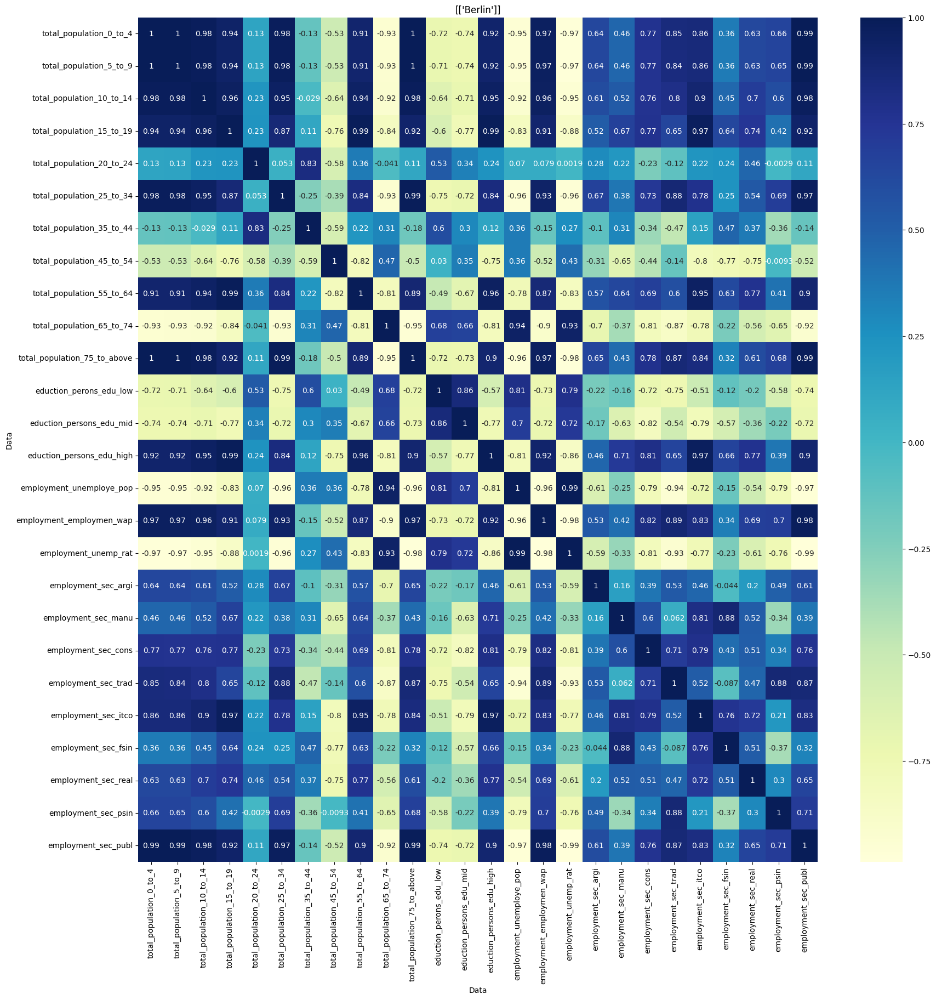

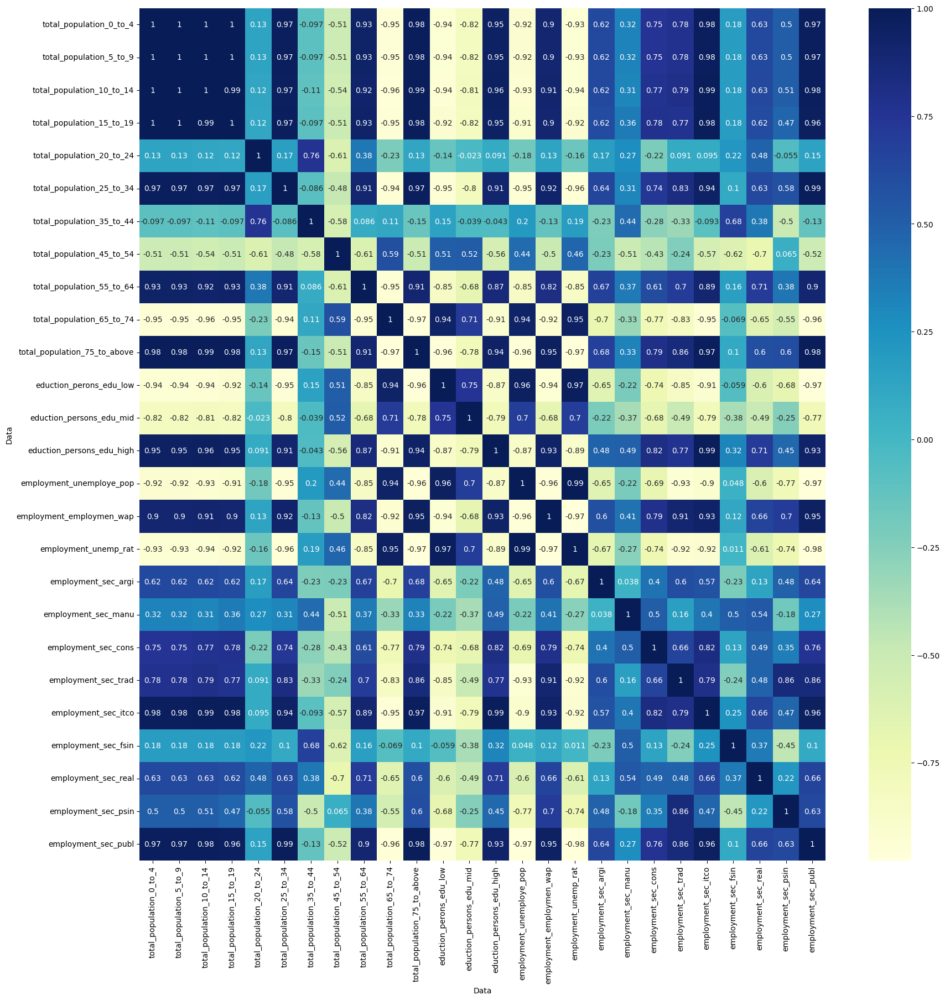

In [25]:
#The following process creates a heatmap using searborn for each correlation of a full city dataset
tmp_corr_data = pd.DataFrame()

corr_df = comb_data.iloc[0:26,2:-1]
print(corr_df.to_markdown())

corr_df = corr_df.set_index(['Data'], drop=True)
corr_df = corr_df.T
corr_df_pearson = corr_df.corr(method='pearson', numeric_only=True)
#corr_df_kendall = corr_df.corr(method='kendall', numeric_only=True)
corr_df_spearman = corr_df.corr(method='spearman', numeric_only=True)
#print(corr_df.to_markdown())

fig, ax = plt.subplots(figsize=(20, 20))
plt.title(comb_data.iloc[0:1,1:2].values)
dataplot01 = sns.heatmap(corr_df_pearson, cmap="YlGnBu", annot=True) 
#fig, ax = plt.subplots(figsize=(20, 20))
#dataplot02 = sns.heatmap(corr_df_kendall, cmap="YlGnBu", annot=True) 
fig, ax = plt.subplots(figsize=(20, 20))
dataplot03 = sns.heatmap(corr_df_spearman, cmap="YlGnBu", annot=True) 
#mp.show() 

#diff = corr_df_pearson.compare(corr_df_spearman, 
#print(diff.to_markdown())
#diff.to_excel("output.xlsx", sheet_name="Difference")

In [26]:
aly_data = copy.deepcopy(data_records)

max_rec = max(aly_data.values())
max_key = [key for key in aly_data if aly_data[key] == max_rec]
aly_data.pop(max_key[0])
#print(max_key[0])
#print(max_rec)

city_code = ''
for index, row in data_dict_non[max_key[0]].iterrows():
    if city_code != [row['TIME']]:
        city_code = [row['TIME']]
        if city_code != "":
            non_copy = False
            temp_ds = data_dict_non[max_key[0]].loc[data_dict_non[max_key[0]]['TIME'].isin(city_code)]
            #pop_rec = data_dict_non[min_key[0]].loc[data_dict_non[min_key[0]]['TIME'] == city_code]
    
            for key, value in aly_data.items():
                tmp_ds = data_dict_non[key].loc[data_dict_non[key]['TIME'].isin(city_code)]
                if tmp_ds.empty: non_copy = True
                temp_ds = pd.concat([temp_ds, tmp_ds], axis=0, ignore_index=True)
        #print(temp_ds.to_markdown())   
    if non_copy == False:
        comb_data = pd.concat([comb_data, temp_ds], axis=0, ignore_index=True)
    temp_ds = temp_ds.iloc[0:0]

full_recs = comb_data.shape[0]/(city_popstruct_df_entnum + city_edustruct_df_entnum + city_employstruct_df_entnum)
print(str(full_recs) + " full city records from data set (Population, Education, Emplyoment)")
print(comb_data.head(28).to_markdown())



172.0 full city records from data set (Population, Education, Emplyoment)
|    | TIME   | TIME.1   | Data                         |            2008 |            2009 |            2010 |            2011 |            2012 |            2013 |           2014 |            2015 |             2016 |             2017 |             2018 |             2019 |             2020 |           2021 |           2022 |      Delta % |
|---:|:-------|:---------|:-----------------------------|----------------:|----------------:|----------------:|----------------:|----------------:|----------------:|---------------:|----------------:|-----------------:|-----------------:|-----------------:|-----------------:|-----------------:|---------------:|---------------:|-------------:|
|  0 | DE001C | Berlin   | total_population_0_to_4      | 144624          | 148744          | 152335          | 157280          | 154374          | 161482          | 167747         | 171814          | 178152           | 187022          

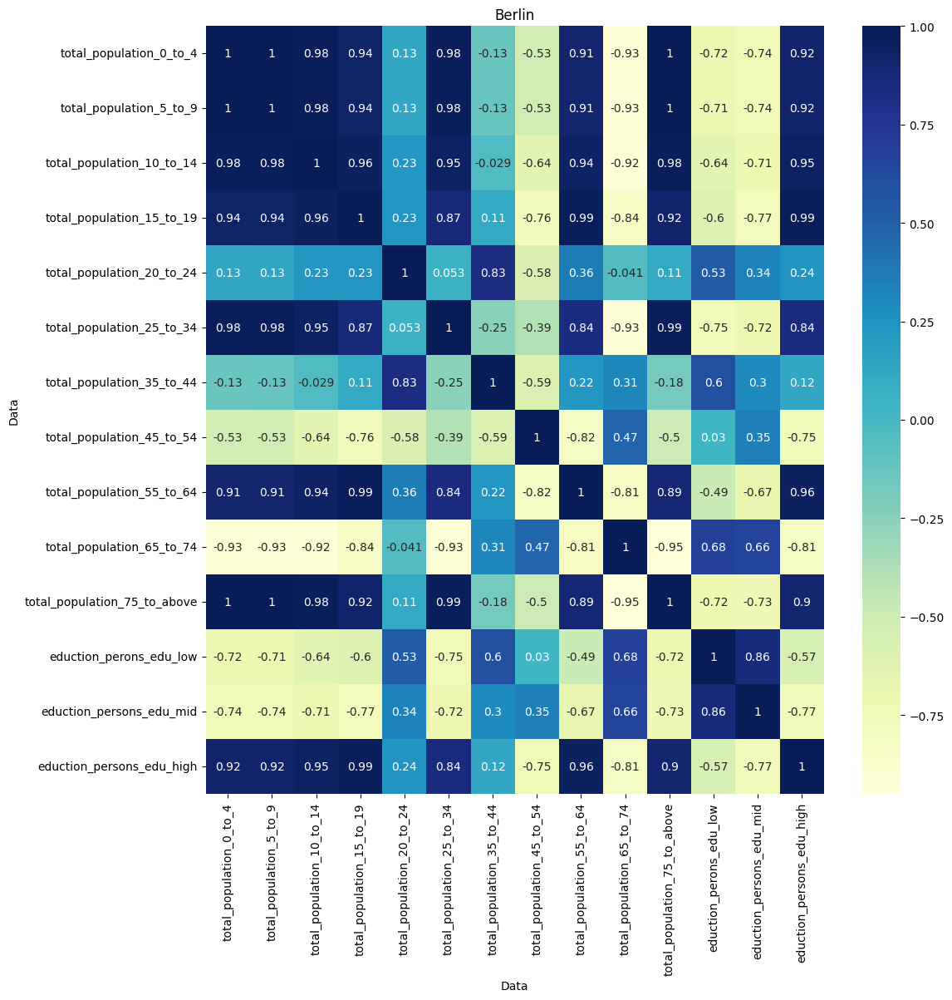

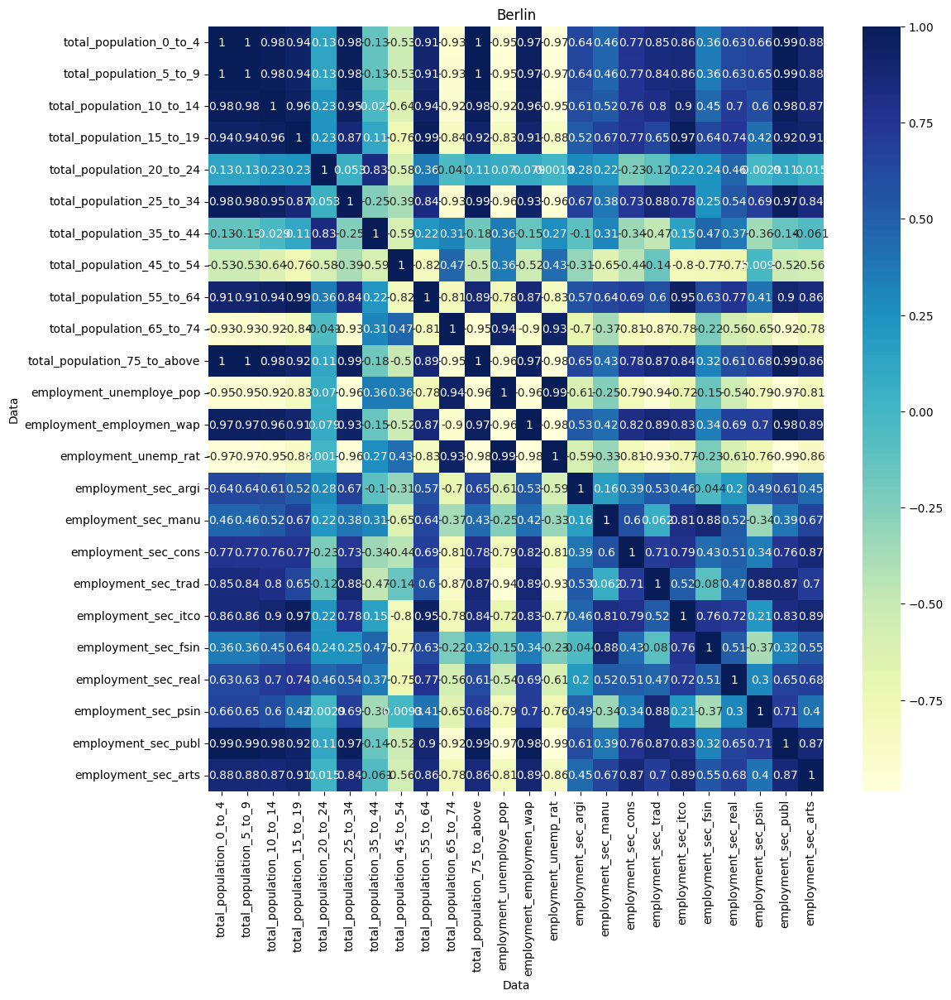

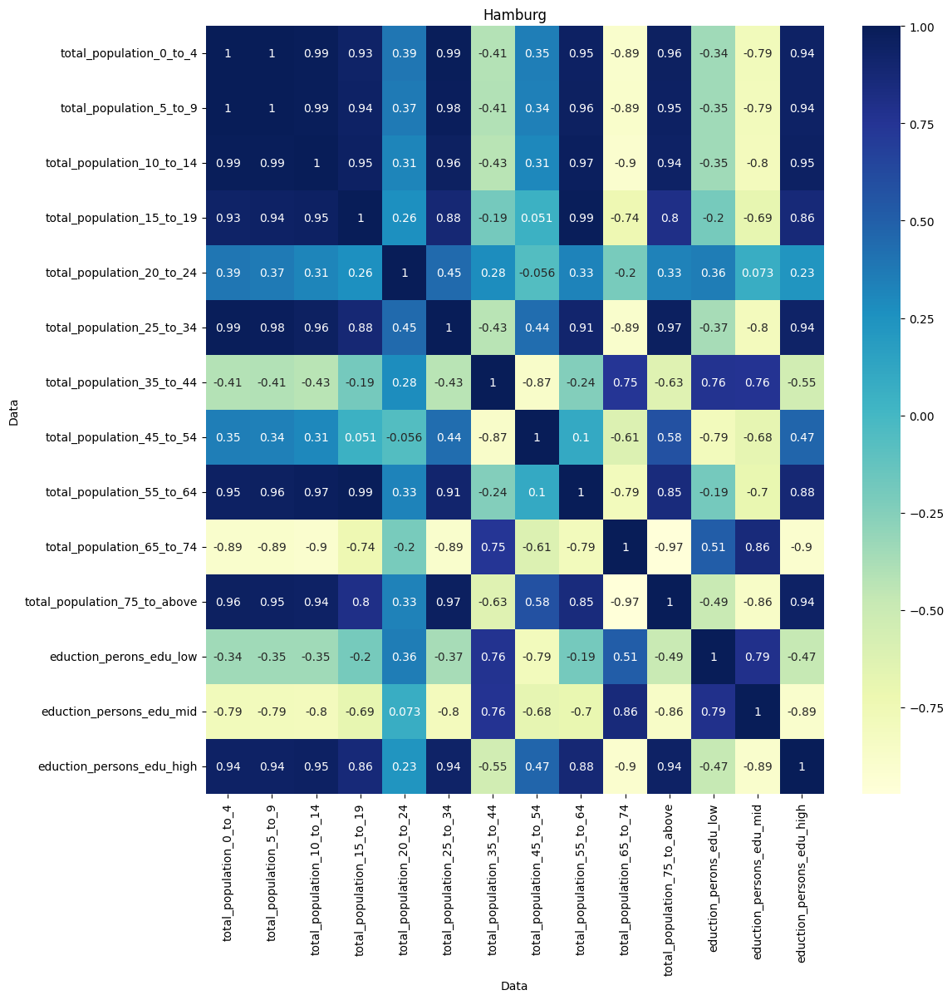

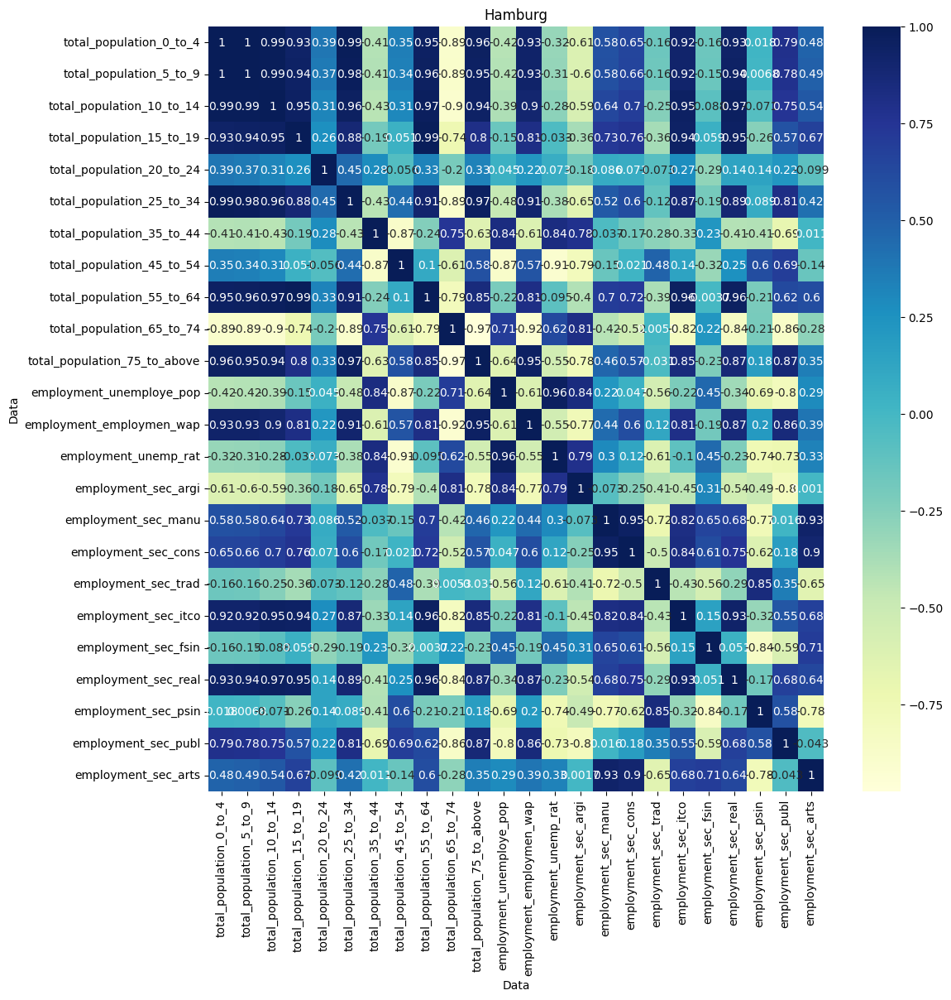

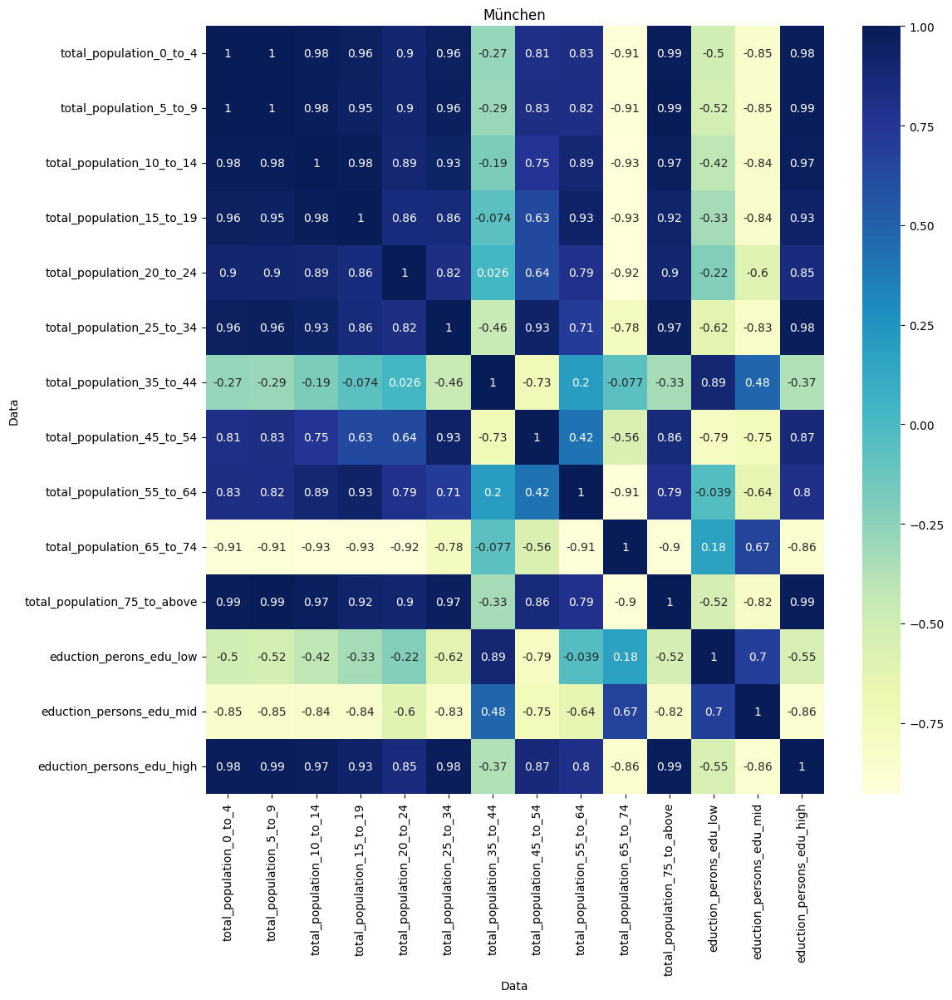

...

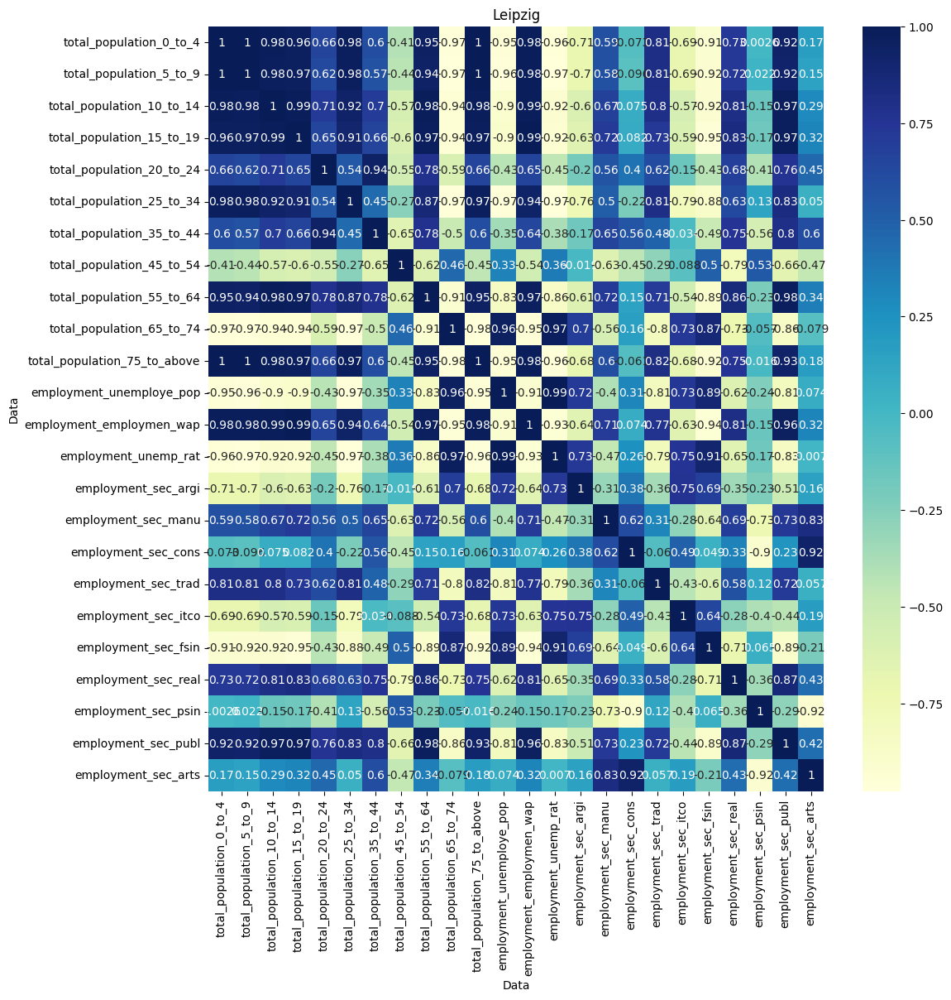

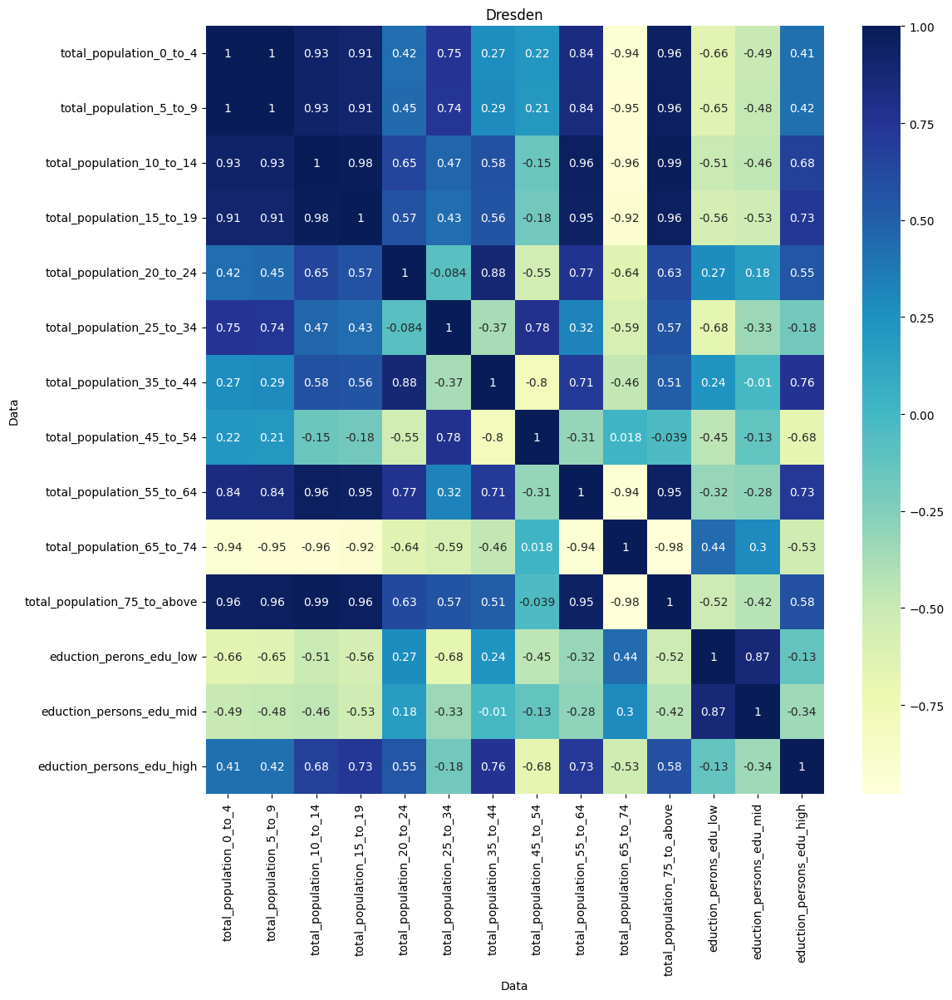

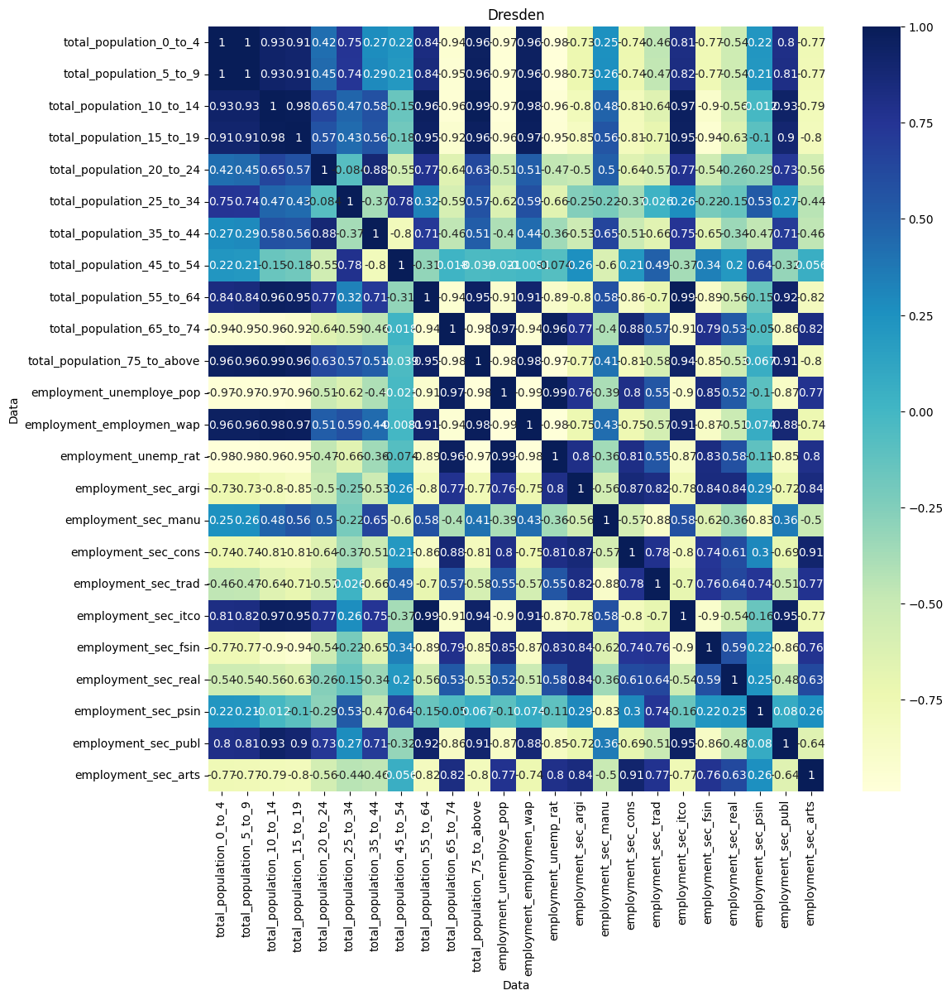

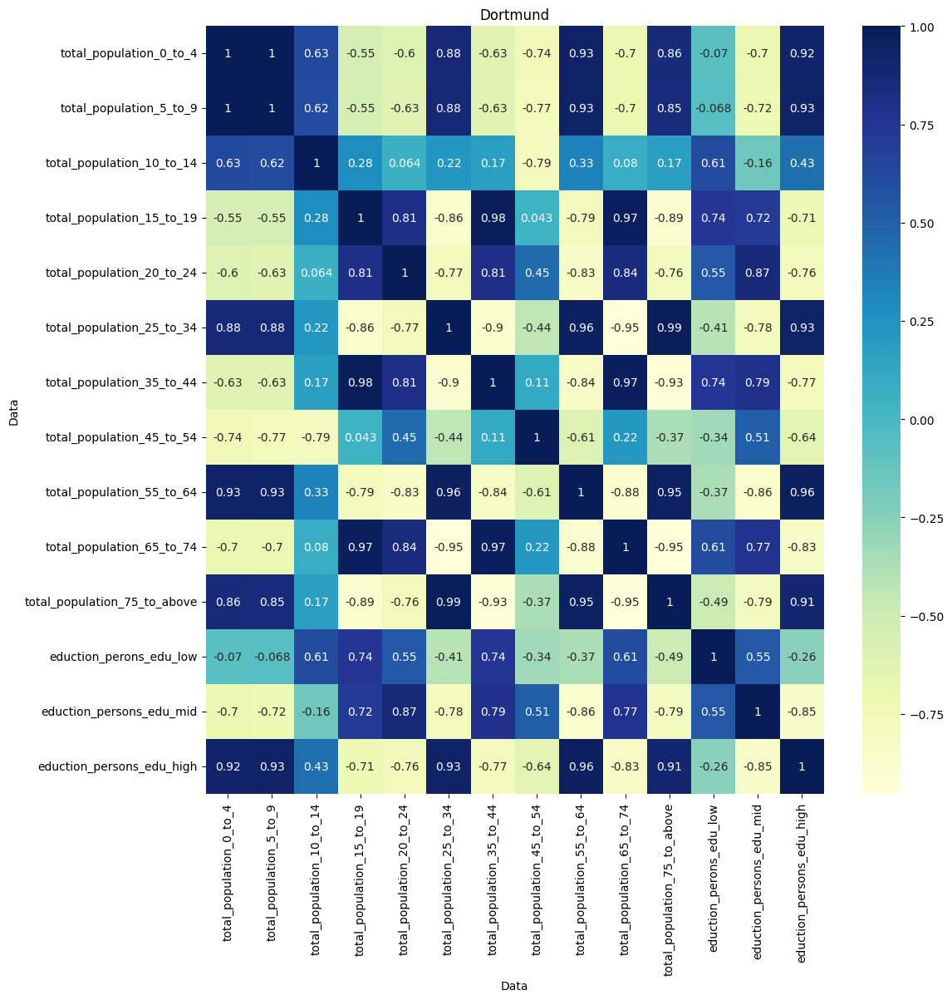

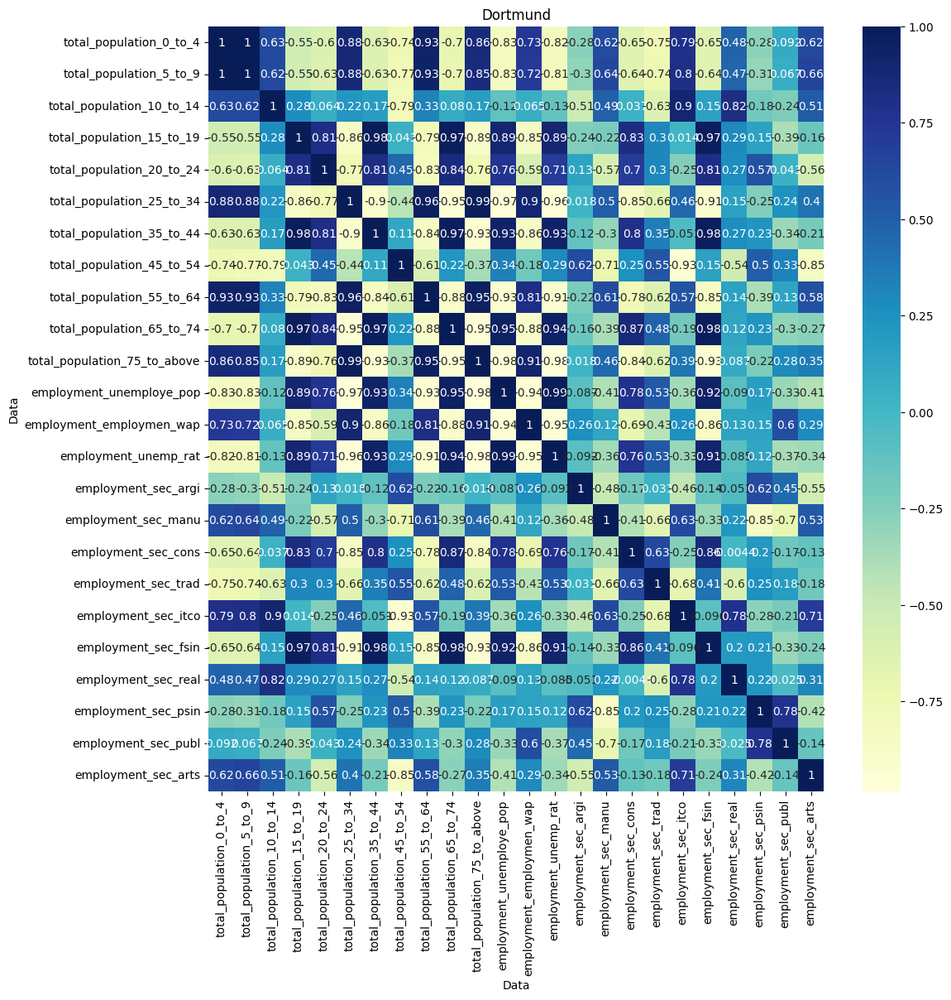

In [27]:
aly_data = copy.deepcopy(data_records)

max_rec = max(aly_data.values())
max_key = [key for key in aly_data if aly_data[key] == max_rec]
aly_data.pop(max_key[0])
#print(max_key[0])
#print(max_rec)

counter = 0 

city_code = ''
for index, row in data_dict_non[max_key[0]].iterrows():
    if city_code != [row['TIME']]:
        city_code = [row['TIME']]
        city_name = [row['TIME.1']]
        if (city_code != "" and counter < 20):
            non_copy = False
            pri_ds = data_dict_non[max_key[0]].loc[data_dict_non[max_key[0]]['TIME'].isin(city_code)]
            #print(pri_ds.to_markdown())
            #pop_rec = data_dict_non[min_key[0]].loc[data_dict_non[min_key[0]]['TIME'] == city_code]
    
            for key, value in aly_data.items():
                scn_ds = data_dict_non[key].loc[data_dict_non[key]['TIME'].isin(city_code)]
                if not pri_ds.empty:
                    corr_df = pd.concat([pri_ds, scn_ds], axis=0, ignore_index=True)
                    corr_df = corr_df.iloc[:,2:-1]
                    #print(corr_df.to_markdown())
                    corr_df = corr_df.set_index(['Data'], drop=True)
                    corr_df = corr_df.T
                    fig, ax = plt.subplots(figsize=(12, 12))
                    plt.title(city_name[0])
                    dataplot = sns.heatmap(corr_df.corr(), cmap="YlGnBu", annot=True)  
                    counter = counter+1
                corr_df = scn_ds.iloc[0:0]


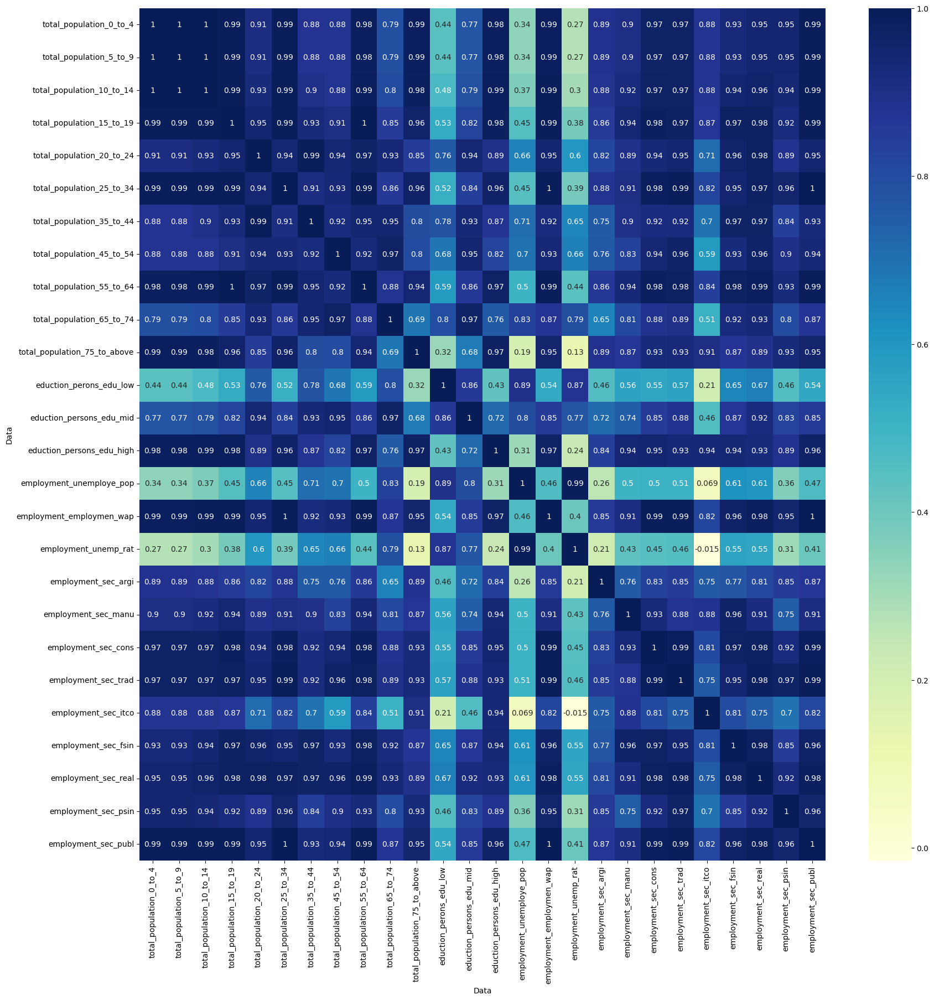

In [28]:
from scipy import stats
import seaborn as sns 

corr_df = comb_data.iloc[0:26,2:]
#print(corr_df.to_markdown())

corr_df = corr_df.set_index(['Data'], drop=True)
corr_df = corr_df.T
#print(corr_df.to_markdown())

fig, ax = plt.subplots(figsize=(20, 20))
dataplot = sns.heatmap(corr_df.corr(), cmap="YlGnBu", annot=True) 
#mp.show() 


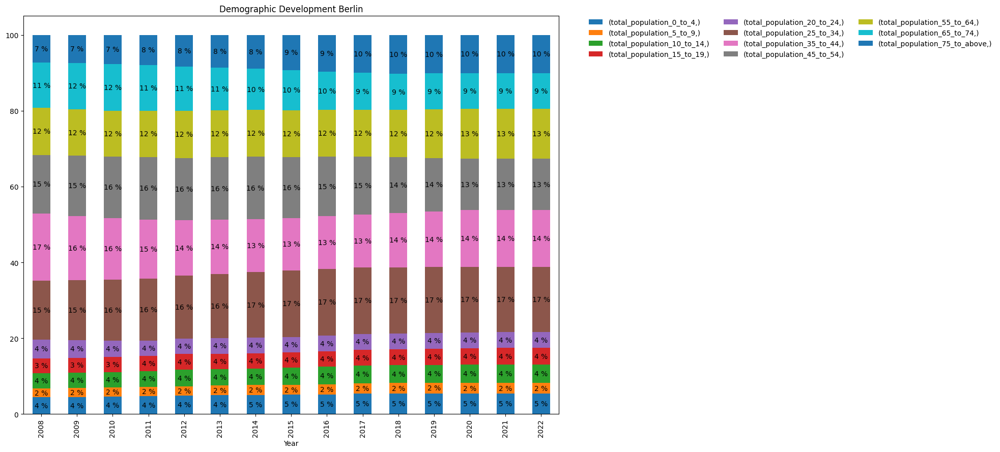

In [29]:
temp_df = city_popstruct_df.iloc[0:11, 0:-1]

data = temp_df.iloc[:,2:].T
col_name = temp_df.iloc[:,2:3]
data.columns = col_name
data = data.iloc[1:,:]
tmp_val = data.index.values
data.insert(0,'Year', tmp_val)

data_new = data.groupby('Year').sum()
data_new_grouped = data_new.div(data_new.sum(axis=1), axis=0).mul(100)
data_new_grouped.plot(kind='bar', stacked=True, title=str('Demographic Development ' + str(temp_df.iloc[1]['TIME.1'])), figsize=(20,9), mark_right = True)

plt.legend(
    bbox_to_anchor=(1.05, 1.0),
    loc="upper left",
    borderaxespad=0,
    frameon=False,
    ncol=3,
)

for ix, row in data_new_grouped.reset_index(drop=True).iterrows():
    cumulative = 0
    for element in row:
        if element == element and element > 0.1:
            plt.text(
                ix,
                cumulative + element / 2,
                f"{int(element)} %",
                va="center",
                ha="center",
            )
        cumulative += element
plt.tight_layout()


In [30]:
temp_df = city_popstruct_df.iloc[0:11, 0:-1]

df_spe = temp_df.iloc[:,0:3]
df_dat = temp_df.iloc[:,3:]

data_sum = df_dat.sum(axis=0)
data_per = df_dat.div(data_sum).mul(100)
df_delta = pd.concat([data_per.iloc[:,0:1], data_per.iloc[:,-1:]], axis=1)
df_delta = df_delta.diff(axis=1)                                       

df_fin = pd.concat([df_spe, data_per], axis=1)
df_fin.insert(len(df_fin.columns),'Delta %', df_delta.loc[:,2022])
print(df_fin.head(20).to_markdown())



|    | TIME   | TIME.1   | Data                         |     2008 |     2009 |     2010 |     2011 |     2012 |     2013 |     2014 |     2015 |     2016 |     2017 |     2018 |     2019 |     2020 |     2021 |     2022 |   Delta % |
|---:|:-------|:---------|:-----------------------------|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|---------:|----------:|
|  0 | DE001C | Berlin   | total_population_0_to_4      |  4.42813 |  4.53493 |  4.63142 |  4.75587 |  4.84171 |  4.97812 |  5.08226 |  5.11314 |  5.20718 |  5.37996 |  5.42217 |  5.45664 |  5.43477 |  5.43154 |  5.43154 |  1.00342  |
|  1 | DE001C | Berlin   | total_population_5_to_9      |  2.27591 |  2.33555 |  2.38188 |  2.44195 |  2.47499 |  2.54957 |  2.61237 |  2.62481 |  2.68082 |  2.76253 |  2.78435 |  2.80049 |  2.79226 |  2.7906  |  2.7906  |  0.514685 |
|  2 | DE001C | Berlin   | total_population_10_to_14    |  4

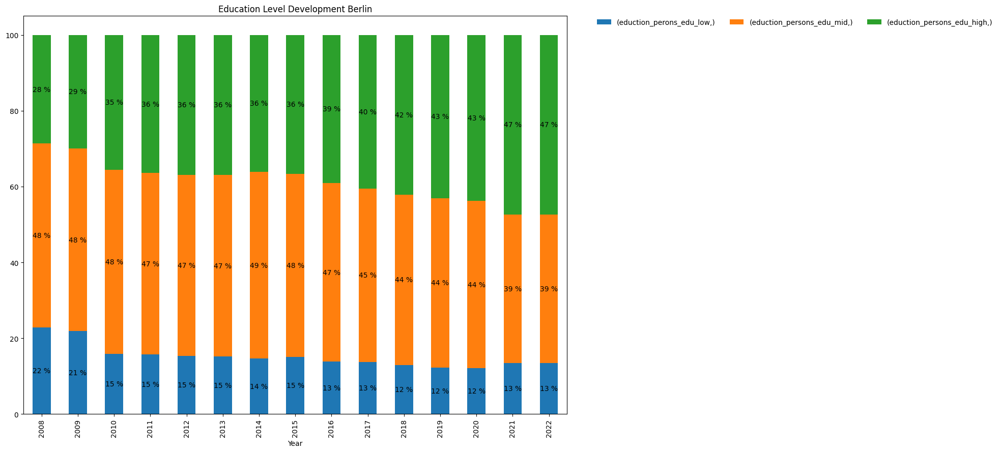

In [31]:
temp_df = city_edustruct_df.iloc[0:3, 0:-1]

data = temp_df.iloc[:,2:].T
col_name = temp_df.iloc[:,2:3]
data.columns = col_name
data = data.iloc[1:,:]
tmp_val = data.index.values
data.insert(0,'Year', tmp_val)

data_new = data.groupby('Year').sum()
data_new_grouped = data_new.div(data_new.sum(axis=1), axis=0).mul(100)
data_new_grouped.plot(kind='bar', stacked=True, title=str('Education Level Development ' + str(temp_df.iloc[1]['TIME.1'])), figsize=(20,9), mark_right = True)

plt.legend(
    bbox_to_anchor=(1.05, 1.0),
    loc="upper left",
    borderaxespad=0,
    frameon=False,
    ncol=3,
)

for ix, row in data_new_grouped.reset_index(drop=True).iterrows():
    cumulative = 0
    for element in row:
        if element == element and element > 0.1:
            plt.text(
                ix,
                cumulative + element / 2,
                f"{int(element)} %",
                va="center",
                ha="center",
            )
        cumulative += element
plt.tight_layout()

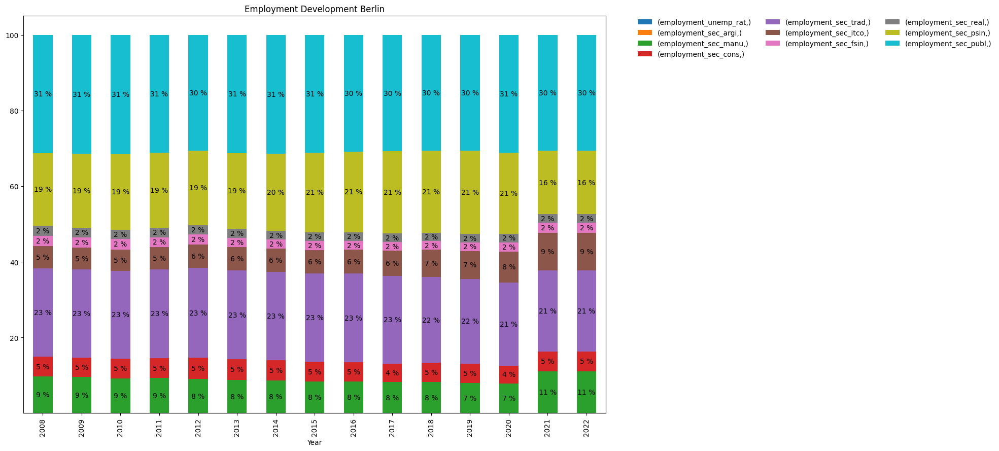

In [32]:
temp_df = city_employstruct_df.iloc[2:12, 0:-1]

data = temp_df.iloc[:,2:].T
col_name = temp_df.iloc[:,2:3]
data.columns = col_name
data = data.iloc[1:,:]
tmp_val = data.index.values
data.insert(0,'Year', tmp_val)

data_new = data.groupby('Year').sum()
data_new_grouped = data_new.div(data_new.sum(axis=1), axis=0).mul(100)
data_new_grouped.plot(kind='bar', stacked=True, title=str('Employment Development ' + str(temp_df.iloc[1]['TIME.1'])), figsize=(20,9), mark_right = True)

plt.legend(
    bbox_to_anchor=(1.05, 1.0),
    loc="upper left",
    borderaxespad=0,
    frameon=False,
    ncol=3,
)

for ix, row in data_new_grouped.reset_index(drop=True).iterrows():
    cumulative = 0
    for element in row:
        if element == element and element > 0.1:
            plt.text(
                ix,
                cumulative + element / 2,
                f"{int(element)} %",
                va="center",
                ha="center",
            )
        cumulative += element
plt.tight_layout()